In [30]:
pip install tensorflow

Note: you may need to restart the kernel to use updated packages.


In [31]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetV2S, ConvNeXtTiny, InceptionV3
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt

In [32]:
# Path to your single dataset folder (should have subfolders for each class)
data_dir = '/teamspace/studios/this_studio/Bottle_Gourd'  # e.g., 'vegetable_dataset/'

# Parameters
BATCH_SIZE = 32
IMG_SIZE = (224, 224)  # DenseNet121 default input size
NUM_CLASSES = 8
EPOCHS = 15
VAL_SPLIT = 0.2  # 20% for validation
TEST_SPLIT = 0.1  # 10% for testing

In [33]:
# Step 2: Load and preprocess dataset with progress bar
def load_dataset(data_dir):
    images = []
    labels = []

    for class_idx, class_name in enumerate(CLASS_NAMES):
        class_dir = os.path.join(data_dir, class_name)
        if not os.path.exists(class_dir):
            print(f"Warning: Directory {class_dir} not found!")
            continue

        print(f"Loading {class_name} images...")
        for img_file in tqdm(os.listdir(class_dir)):
            img_path = os.path.join(class_dir, img_file)
            try:
                with Image.open(img_path) as img:
                    img = img.convert('RGB')  # Ensure RGB format
                    img = img.resize(IMAGE_SIZE)
                    img_array = np.array(img) / 255.0
                    if img_array.shape == (*IMAGE_SIZE, 3):
                        images.append(img_array)
                        labels.append(class_idx)
            except Exception as e:
                print(f"Error loading {img_path}: {e}")

    return np.array(images), np.array(labels)

In [34]:
pip install imbalanced-learn


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 166.2 MB/s  0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.4.4
    Uninstalling numpy-2.4.4:
      Successfully uninstalled numpy-2.4.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
opencv-python-headless 4.13.0.92 requires numpy>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
opencv-python 4.13.0.92 requires numpy>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
Note: you may need to restart the kernel to use updated packages.


In [35]:
import os
import numpy as np
import tensorflow as tf
import random
from sklearn.model_selection import train_test_split
from collections import Counter
from tensorflow.keras.preprocessing.image import img_to_array, load_img, ImageDataGenerator

IMG_SIZE = (224, 224)
TARGET_PER_CLASS = 1000  # 3x from 500 original images

# 🏷 Class names
class_names = sorted(os.listdir(data_dir))
NUM_CLASSES = len(class_names)
print("Classes:", class_names)

# 🎛 Data Augmentation Setup
aug_gen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    shear_range=0.15,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2],
    fill_mode='nearest'
)

# 🖼 Load images and apply augmentation
all_images = []
all_labels = []

for class_idx, class_name in enumerate(class_names):
    class_path = os.path.join(data_dir, class_name)
    img_names = os.listdir(class_path)
    img_paths = [os.path.join(class_path, img) for img in img_names]

    # Load original images
    original_images = []
    for img_path in img_paths:
        img = load_img(img_path, target_size=IMG_SIZE)
        img_array = img_to_array(img)
        img_array = tf.keras.applications.mobilenet_v2.preprocess_input(img_array)
        original_images.append(img_array)

    # Add original images
    all_images.extend(original_images)
    all_labels.extend([class_idx] * len(original_images))

    # Number of augmented images to generate
    num_to_generate = TARGET_PER_CLASS - len(original_images)
    print(f"{class_name}: Generating {num_to_generate} augmented images")

    i = 0
    while i < num_to_generate:
        img = random.choice(original_images)
        img = np.expand_dims(img, axis=0)
        for batch in aug_gen.flow(img, batch_size=1):
            all_images.append(batch[0])
            all_labels.append(class_idx)
            i += 1
            if i >= num_to_generate:
                break

# 🔀 Final dataset
X = np.array(all_images)
y = np.array(all_labels)
print(f"\n✅ Total images after augmentation: {X.shape[0]}")
print("Class distribution:", Counter(y))

# 🔀 Split: 15% test, then 15% val, rest train
X_temp, X_test, y_temp, y_test = train_test_split(X, y, test_size=0.15, stratify=y, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.1765, stratify=y_temp, random_state=42)

# 📦 TF Datasets
def create_dataset(X, y):
    return tf.data.Dataset.from_tensor_slices((X, tf.one_hot(y, depth=NUM_CLASSES)))

train_ds = create_dataset(X_train, y_train).shuffle(1000).batch(BATCH_SIZE)
val_ds = create_dataset(X_val, y_val).batch(BATCH_SIZE)
test_ds = create_dataset(X_test, y_test).batch(BATCH_SIZE)

# 🧾 Summary
print("\n✅ Final dataset shapes:")
print("Train:", X_train.shape, " | ", Counter(y_train))
print("Val  :", X_val.shape, " | ", Counter(y_val))
print("Test :", X_test.shape, " | ", Counter(y_test))

Classes: ['Alternaria_Leaf_Blight', 'Angular_Leaf_spot', 'Anthracnose', 'Downy_Mildew', 'Early_Alternaria_Leaf_Blight', 'Fungal_Damage_Leaf', 'Healthy', 'Mosaic_Virus']
Alternaria_Leaf_Blight: Generating 821 augmented images
Angular_Leaf_spot: Generating 986 augmented images


Anthracnose: Generating 502 augmented images
Downy_Mildew: Generating 954 augmented images
Early_Alternaria_Leaf_Blight: Generating 955 augmented images
Fungal_Damage_Leaf: Generating 969 augmented images
Healthy: Generating 945 augmented images
Mosaic_Virus: Generating 749 augmented images

✅ Total images after augmentation: 8000
Class distribution: Counter({0: 1000, 1: 1000, 2: 1000, 3: 1000, 4: 1000, 5: 1000, 6: 1000, 7: 1000})

✅ Final dataset shapes:
Train: (5599, 224, 224, 3)  |  Counter({5: 700, 7: 700, 4: 700, 1: 700, 2: 700, 3: 700, 0: 700, 6: 699})
Val  : (1201, 224, 224, 3)  |  Counter({6: 151, 1: 150, 7: 150, 0: 150, 5: 150, 4: 150, 3: 150, 2: 150})
Test : (1200, 224, 224, 3)  |  Counter({7: 150, 5: 150, 0: 150, 2: 150, 1: 150, 3: 150, 4: 150, 6: 150})


In [36]:
from tensorflow.keras.applications import EfficientNetV2S, ConvNeXtTiny, InceptionV3
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, Input, Add, Lambda
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
import tensorflow as tf

# Constants
INPUT_SHAPE = (224, 224, 3)
NUM_CLASSES = 8 

def create_individual_model(base_model_class, dropout_rate=0.2):
    """Helper function to create individual models with consistent architecture"""
    base_model = base_model_class(weights="imagenet", include_top=False, input_shape=INPUT_SHAPE)
    base_model.trainable = True # উচ্চমানের পেপারের জন্য ফুল ট্রেনিং বা ফাইন-টিউনিং জরুরি
    
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(512, activation='relu')(x)
    x = Dropout(dropout_rate)(x)
    predictions = Dense(NUM_CLASSES, activation='softmax')(x)
    
    return Model(inputs=base_model.input, outputs=predictions)

def build_ensemble():
    """Build the ensemble model combining all three models correctly"""
    # ১. ইন্ডিভিজুয়াল মডেল তৈরি
    efficient = create_individual_model(EfficientNetV2S, dropout_rate=0.2)
    convnext = create_individual_model(ConvNeXtTiny, dropout_rate=0.2)
    inception = create_individual_model(InceptionV3, dropout_rate=0.5)
    
    # ২. ৩টি মডেলের জন্য ৩টি আলাদা ইনপুট লেয়ার
    input_efficient = Input(shape=INPUT_SHAPE, name='input_efficient')
    input_convnext = Input(shape=INPUT_SHAPE, name='input_convnext')
    input_inception = Input(shape=INPUT_SHAPE, name='input_inception')
    
    # ৩. আউটপুট প্রেডিকশন পাওয়া
    pred_efficient = efficient(input_efficient)
    pred_convnext = convnext(input_convnext)
    pred_inception = inception(input_inception)
    
    # ৪. ওয়েটেড ফিউশন লজিক (Weights sum to ~1.0)
    weights = {
        'efficient': 0.335,
        'convnext': 0.332,
        'inception': 0.333 # যোগফল ১.০ রাখার জন্য সামান্য অ্যাডজাস্ট করা হয়েছে
    }
    
    # ৫. ওয়েট গুণ করা
    weighted_efficient = Lambda(lambda x: x * weights['efficient'])(pred_efficient)
    weighted_convnext = Lambda(lambda x: x * weights['convnext'])(pred_convnext)
    weighted_inception = Lambda(lambda x: x * weights['inception'])(pred_inception)
    
    # ✅ ফিক্স: Average() এর বদলে Add() ব্যবহার করা হয়েছে
    # কারণ ওয়েট গুণ করার পর গড় করলে রেজাল্ট ০.৩৩ এ নেমে যায়। Add করলে এটি ১.০ থাকবে।
    ensemble_output = Add()([weighted_efficient, weighted_convnext, weighted_inception])
    
    # ৬. ফাইনাল এনসেম্বল মডেল তৈরি
    ensemble_model = Model(
        inputs=[input_efficient, input_convnext, input_inception],
        outputs=ensemble_output,
        name='Synergistic_Weighted_Ensemble'
    )
    
    return ensemble_model

def compile_ensemble(model):
    """Compile the ensemble model"""
    model.compile(
        optimizer=Adam(learning_rate=1e-4),
        loss='categorical_crossentropy',
        metrics=['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]
    )

# মডেল তৈরি এবং কম্পাইল করা
ensemble_model = build_ensemble()
compile_ensemble(ensemble_model)

# মডেল সামারি চেক করুন
ensemble_model.summary()

Model: "Synergistic_Weighted_Ensemble"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_efficient     │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_convnext      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_inception     │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_16       │ (None, 8)         │ 20,991,336 │ input_efficient[… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_21       │ (None, 8)         │ 28,217,960 │ input_convnext[0… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_22       │ (None, 8)         │ 22,855,976 │ input_inception[… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda_6 (Lambda)   │ (None, 8)         │          0 │ functional_16[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda_7 (Lambda)   │ (None, 8)         │          0 │ functional_21[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda_8 (Lambda)   │ (None, 8)         │          0 │ functional_22[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_55 (Add)        │ (None, 8)         │          0 │ lambda_6[0][0],   │
│                     │                   │            │ lambda_7[0][0],   │
│                     │                   │            │ lambda_8[0][0]    │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 72,065,272 (274.91 MB)

 Trainable params: 71,876,968 (274.19 MB)

 Non-trainable params: 188,304 (735.56 KB)

In [37]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam

# Adapt dataset to provide 3 identical inputs for the ensemble
def adapt_for_ensemble(ds):
    return ds.map(lambda x, y: ((x, x, x), y))

# Adapt train and val datasets
train_ds_ensemble = adapt_for_ensemble(train_ds)
val_ds_ensemble = adapt_for_ensemble(val_ds)

# Define model name
model_name = "top3_ensemble"

# Callbacks
checkpoint = ModelCheckpoint(
    f"{model_name}.h5",
    monitor='val_accuracy',
    save_best_only=True,
    mode='max',
    verbose=1
)

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True,
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=3,
    min_lr=1e-4,
    verbose=1
)

# Compile the ensemble model (if not already compiled)
ensemble_model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]
)

# Train the ensemble model
history = ensemble_model.fit(
    train_ds_ensemble,
    validation_data=val_ds_ensemble,
    epochs=EPOCHS,
    callbacks=[checkpoint, early_stop, reduce_lr]
)


Epoch 1/15


175/175 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8464 - loss: 0.5880 - precision_3: 0.9416 - recall_3: 0.6865
Epoch 1: val_accuracy improved from None to 0.95254, saving model to top3_ensemble.h5



Epoch 1: finished saving model to top3_ensemble.h5
175/175 ━━━━━━━━━━━━━━━━━━━━ 678s 4s/step - accuracy: 0.9173 - loss: 0.3026 - precision_3: 0.9735 - recall_3: 0.8527 - val_accuracy: 0.9525 - val_loss: 0.1536 - val_precision_3: 0.9757 - val_recall_3: 0.9359 - learning_rate: 1.0000e-04
Epoch 2/15
175/175 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9555 - loss: 0.1274 - precision_3: 0.9778 - recall_3: 0.9339
Epoch 2: val_accuracy did not improve from 0.95254
175/175 ━━━━━━━━━━━━━━━━━━━━ 603s 3s/step - accuracy: 0.9595 - loss: 0.1195 - precision_3: 0.9795 - recall_3: 0.9387 - val_accuracy: 0.9525 - val_loss: 0.1345 - val_precision_3: 0.9709 - val_recall_3: 0.9434 - learning_rate: 1.0000e-04
Epoch 3/15
175/175 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9690 - loss: 0.0932 - precision_3: 0.9803 - recall_3: 0.9576
Epoch 3: val_accuracy improved from 0.95254 to 0.95754, saving model to top3_ensemble.h5



Epoch 3: finished saving model to top3_ensemble.h5
175/175 ━━━━━━━━━━━━━━━━━━━━ 604s 3s/step - accuracy: 0.9714 - loss: 0.0852 - precision_3: 0.9823 - recall_3: 0.9609 - val_accuracy: 0.9575 - val_loss: 0.1032 - val_precision_3: 0.9794 - val_recall_3: 0.9484 - learning_rate: 1.0000e-04
Epoch 4/15
175/175 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9758 - loss: 0.0611 - precision_3: 0.9833 - recall_3: 0.9692
Epoch 4: val_accuracy improved from 0.95754 to 0.95920, saving model to top3_ensemble.h5



Epoch 4: finished saving model to top3_ensemble.h5
175/175 ━━━━━━━━━━━━━━━━━━━━ 604s 3s/step - accuracy: 0.9786 - loss: 0.0588 - precision_3: 0.9859 - recall_3: 0.9712 - val_accuracy: 0.9592 - val_loss: 0.1183 - val_precision_3: 0.9776 - val_recall_3: 0.9434 - learning_rate: 1.0000e-04
Epoch 5/15
175/175 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9851 - loss: 0.0479 - precision_3: 0.9916 - recall_3: 0.9799
Epoch 5: val_accuracy improved from 0.95920 to 0.96420, saving model to top3_ensemble.h5



Epoch 5: finished saving model to top3_ensemble.h5
175/175 ━━━━━━━━━━━━━━━━━━━━ 607s 3s/step - accuracy: 0.9852 - loss: 0.0473 - precision_3: 0.9901 - recall_3: 0.9795 - val_accuracy: 0.9642 - val_loss: 0.1205 - val_precision_3: 0.9809 - val_recall_3: 0.9417 - learning_rate: 1.0000e-04
Epoch 6/15
175/175 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9911 - loss: 0.0367 - precision_3: 0.9938 - recall_3: 0.9881
Epoch 6: val_accuracy improved from 0.96420 to 0.96586, saving model to top3_ensemble.h5



Epoch 6: finished saving model to top3_ensemble.h5
175/175 ━━━━━━━━━━━━━━━━━━━━ 606s 3s/step - accuracy: 0.9904 - loss: 0.0379 - precision_3: 0.9926 - recall_3: 0.9862 - val_accuracy: 0.9659 - val_loss: 0.1169 - val_precision_3: 0.9760 - val_recall_3: 0.9484 - learning_rate: 1.0000e-04
Epoch 7/15
175/175 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9907 - loss: 0.0384 - precision_3: 0.9947 - recall_3: 0.9863
Epoch 7: val_accuracy improved from 0.96586 to 0.96919, saving model to top3_ensemble.h5



Epoch 7: finished saving model to top3_ensemble.h5
175/175 ━━━━━━━━━━━━━━━━━━━━ 604s 3s/step - accuracy: 0.9905 - loss: 0.0403 - precision_3: 0.9930 - recall_3: 0.9859 - val_accuracy: 0.9692 - val_loss: 0.1189 - val_precision_3: 0.9779 - val_recall_3: 0.9567 - learning_rate: 1.0000e-04
Epoch 8/15
175/175 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9932 - loss: 0.0396 - precision_3: 0.9954 - recall_3: 0.9874
Epoch 8: val_accuracy did not improve from 0.96919
175/175 ━━━━━━━━━━━━━━━━━━━━ 603s 3s/step - accuracy: 0.9929 - loss: 0.0359 - precision_3: 0.9953 - recall_3: 0.9879 - val_accuracy: 0.9659 - val_loss: 0.1086 - val_precision_3: 0.9755 - val_recall_3: 0.9600 - learning_rate: 1.0000e-04
Epoch 8: early stopping
Restoring model weights from the end of the best epoch: 3.


In [38]:
pip install seaborn


Note: you may need to restart the kernel to use updated packages.


38/38 ━━━━━━━━━━━━━━━━━━━━ 37s 830ms/step
Classification Report:

                              precision    recall  f1-score   support

      Alternaria_Leaf_Blight       0.92      0.93      0.92       150
           Angular_Leaf_spot       0.99      0.99      0.99       150
                 Anthracnose       0.81      0.93      0.86       150
                Downy_Mildew       0.99      0.99      0.99       150
Early_Alternaria_Leaf_Blight       0.99      0.96      0.98       150
          Fungal_Damage_Leaf       0.99      0.98      0.99       150
                     Healthy       0.99      0.99      0.99       150
                Mosaic_Virus       0.94      0.85      0.89       150

                    accuracy                           0.95      1200
                   macro avg       0.95      0.95      0.95      1200
                weighted avg       0.95      0.95      0.95      1200


Confusion matrix, without normalization


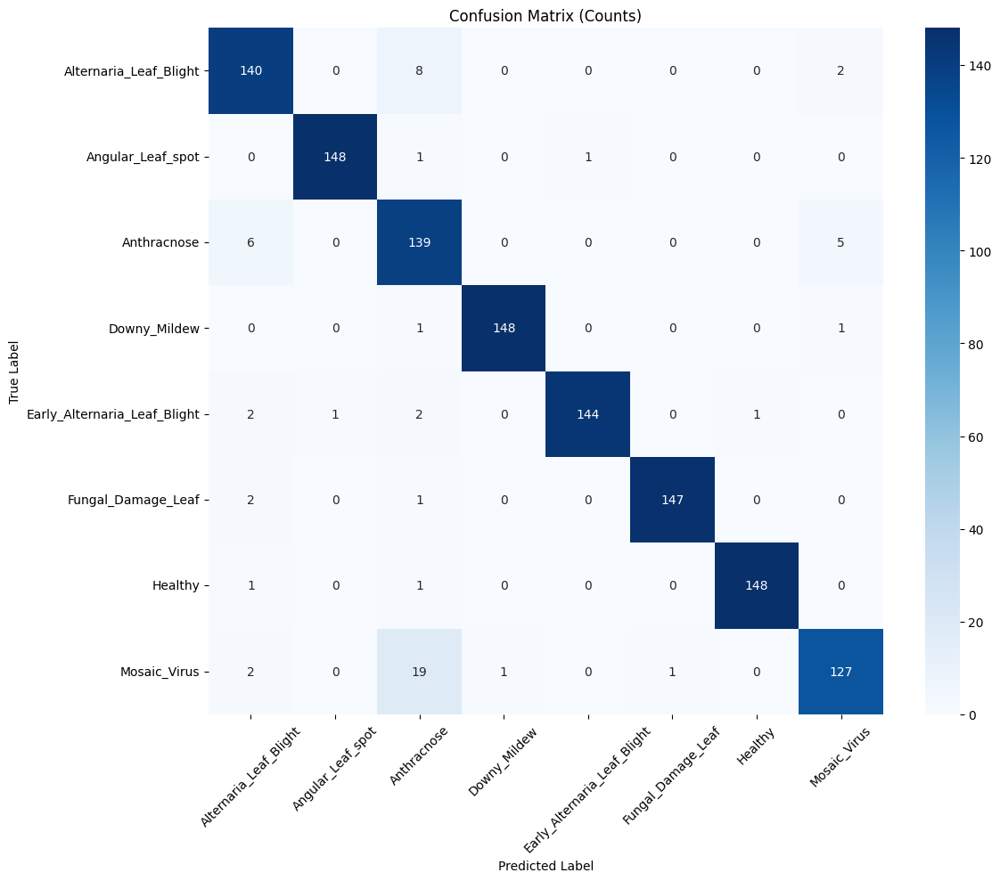


Normalized confusion matrix


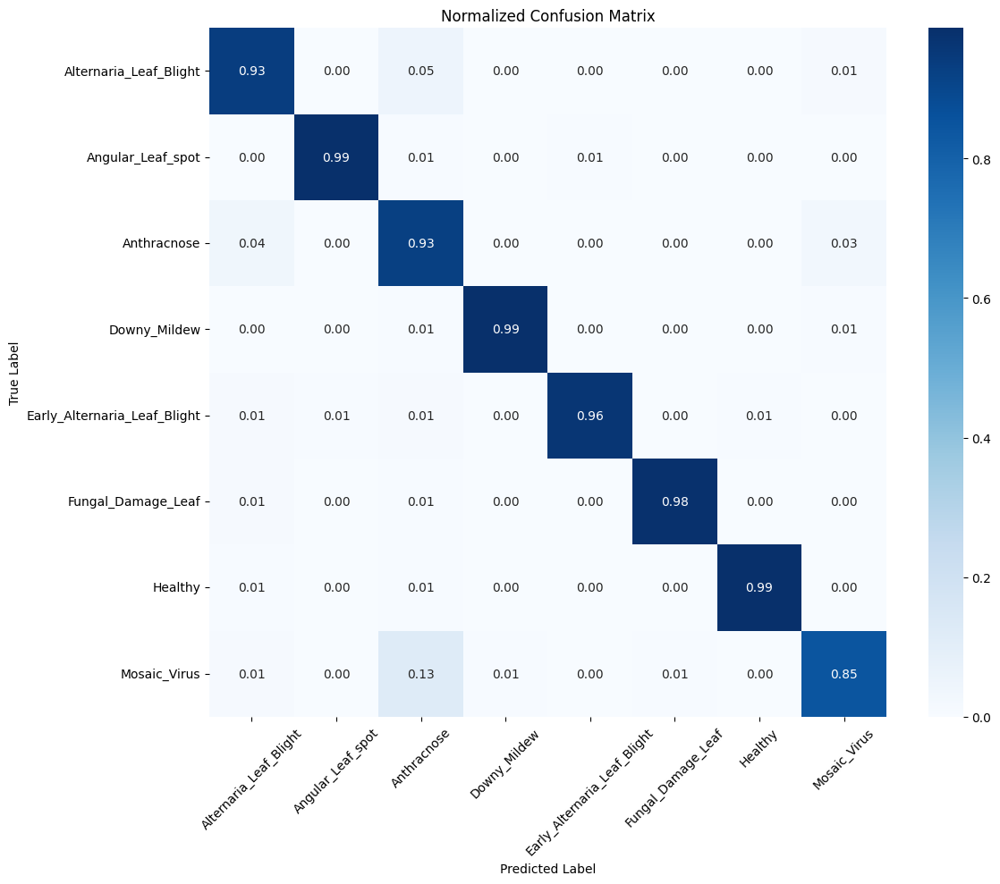

In [39]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix

# ✅ Ensemble expects 3 inputs, so we must pass (x, x, x)
def prepare_test_for_prediction(ds):
    return ds.map(lambda x, y: ((x, x, x), y))

# 🧪 Prepare test dataset for prediction
test_ds_ens = prepare_test_for_prediction(test_ds)

# 🔍 Predict
y_pred_probs = ensemble_model.predict(test_ds_ens)
y_pred_classes = np.argmax(y_pred_probs, axis=1)

# 🎯 Extract true labels
y_true = []
for _, labels in test_ds:
    y_true.extend(np.argmax(labels.numpy(), axis=1))
y_true = np.array(y_true)

# 🧾 Classification report
print("Classification Report:\n")
print(classification_report(y_true, y_pred_classes, target_names=class_names))

# 📊 Confusion matrix plotting function
def plot_confusion_matrix(y_true, y_pred, classes, normalize=False, title='Confusion Matrix', cmap=plt.cm.Blues):
    cm = confusion_matrix(y_true, y_pred)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1, keepdims=True)
        print("\nNormalized confusion matrix")
    else:
        print("\nConfusion matrix, without normalization")

    plt.figure(figsize=(12, 10))
    sns.heatmap(cm, annot=True, fmt='.2f' if normalize else 'd',
                cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

# 🖼️ Plot both confusion matrices
plot_confusion_matrix(y_true, y_pred_classes, classes=class_names, title='Confusion Matrix (Counts)')
plot_confusion_matrix(y_true, y_pred_classes, classes=class_names, normalize=True, title='Normalized Confusion Matrix')


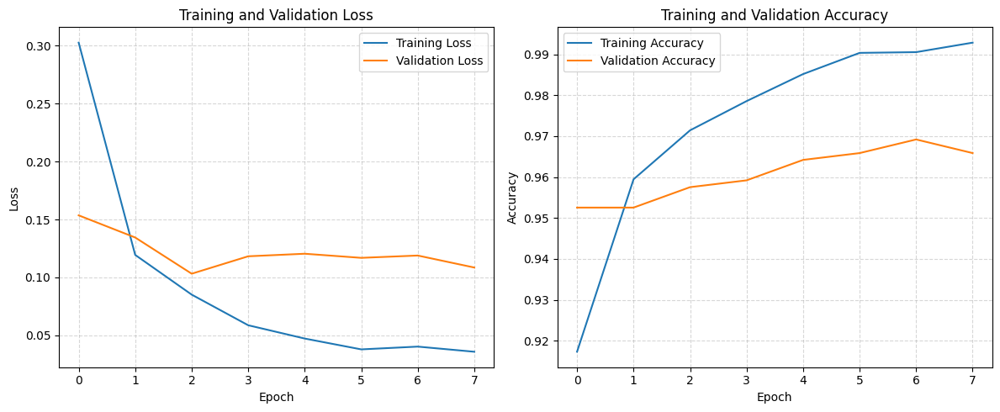


📉 Best Validation Loss: 0.1032 at epoch 3
   Training Loss at that epoch: 0.0852
   Validation Accuracy at that epoch: 0.9575


In [40]:
import matplotlib.pyplot as plt
import numpy as np  # Ensure numpy is imported

# ✅ Make sure to pass the correct 'history' object from model.fit()
# Example: history = train_ensemble(ensemble_model, train_ds, val_ds, epochs=...)
history_dict = history.history

# 📊 Create figure with two subplots
plt.figure(figsize=(12, 5))

# 1️⃣ Plot Loss Curves
plt.subplot(1, 2, 1)
plt.plot(history_dict['loss'], label='Training Loss')
plt.plot(history_dict['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)

# 2️⃣ Plot Accuracy Curves
plt.subplot(1, 2, 2)
plt.plot(history_dict['accuracy'], label='Training Accuracy')
plt.plot(history_dict['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

# 🏆 Optional: Print best validation loss & related info
best_val_epoch = np.argmin(history_dict['val_loss'])
print(f"\n📉 Best Validation Loss: {history_dict['val_loss'][best_val_epoch]:.4f} at epoch {best_val_epoch + 1}")
print(f"   Training Loss at that epoch: {history_dict['loss'][best_val_epoch]:.4f}")
print(f"   Validation Accuracy at that epoch: {history_dict['val_accuracy'][best_val_epoch]:.4f}")


38/38 ━━━━━━━━━━━━━━━━━━━━ 28s 728ms/step


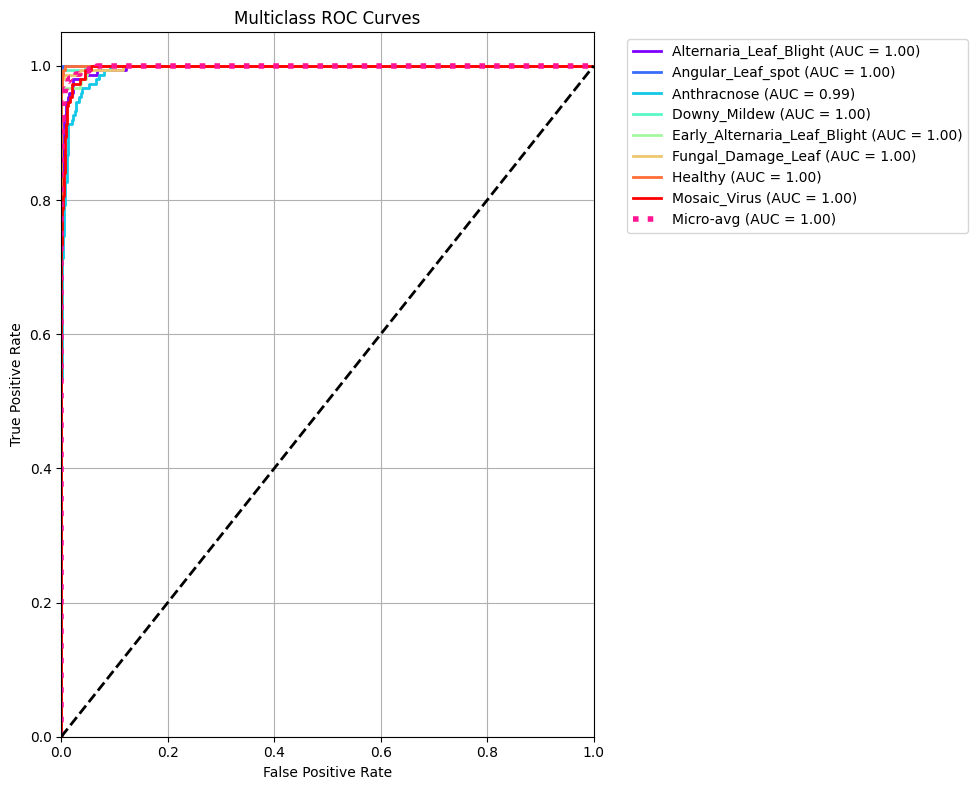


📊 AUC Scores:
Alternaria_Leaf_Blight: 0.9972
Angular_Leaf_spot: 1.0000
Anthracnose: 0.9941
Downy_Mildew: 0.9997
Early_Alternaria_Leaf_Blight: 0.9985
Fungal_Damage_Leaf: 0.9990
Healthy: 0.9999
Mosaic_Virus: 0.9970

Micro-average AUC: 0.9987


In [41]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from itertools import cycle
import matplotlib.pyplot as plt
import numpy as np

# ✅ Step 1: Prepare test dataset for ensemble model (x, x, x)
def prepare_test_for_prediction(ds):
    return ds.map(lambda x, y: ((x, x, x), y))

test_ds_ens = prepare_test_for_prediction(test_ds)

# ✅ Step 2: Get predictions from model
y_pred = ensemble_model.predict(test_ds_ens)

# ✅ Step 3: Get true labels from one-hot encoded test set
y_true = np.concatenate([y.numpy() for _, y in test_ds], axis=0)
y_true_labels = np.argmax(y_true, axis=1)  # Convert one-hot to labels

# ✅ Step 4: Binarize the true labels for ROC
y_true_bin = label_binarize(y_true_labels, classes=np.arange(NUM_CLASSES))

# ✅ Step 5: Compute ROC curves and AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(NUM_CLASSES):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# ✅ Step 6: Compute micro-average ROC
fpr["micro"], tpr["micro"], _ = roc_curve(y_true_bin.ravel(), y_pred.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# ✅ Step 7: Plot ROC curves
plt.figure(figsize=(10, 8))
colors = cycle(plt.cm.rainbow(np.linspace(0, 1, NUM_CLASSES)))

for i, color in zip(range(NUM_CLASSES), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'{class_names[i]} (AUC = {roc_auc[i]:0.2f})')

# Micro-average curve
plt.plot(fpr["micro"], tpr["micro"],
         label=f'Micro-avg (AUC = {roc_auc["micro"]:0.2f})',
         color='deeppink', linestyle=':', linewidth=4)

# Random baseline
plt.plot([0, 1], [0, 1], 'k--', lw=2)

# Final plot settings
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multiclass ROC Curves')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

# ✅ Step 8: Print AUC scores
print("\n📊 AUC Scores:")
for i in range(NUM_CLASSES):
    print(f"{class_names[i]}: {roc_auc[i]:.4f}")
print(f"\nMicro-average AUC: {roc_auc['micro']:.4f}")


38/38 ━━━━━━━━━━━━━━━━━━━━ 28s 727ms/step


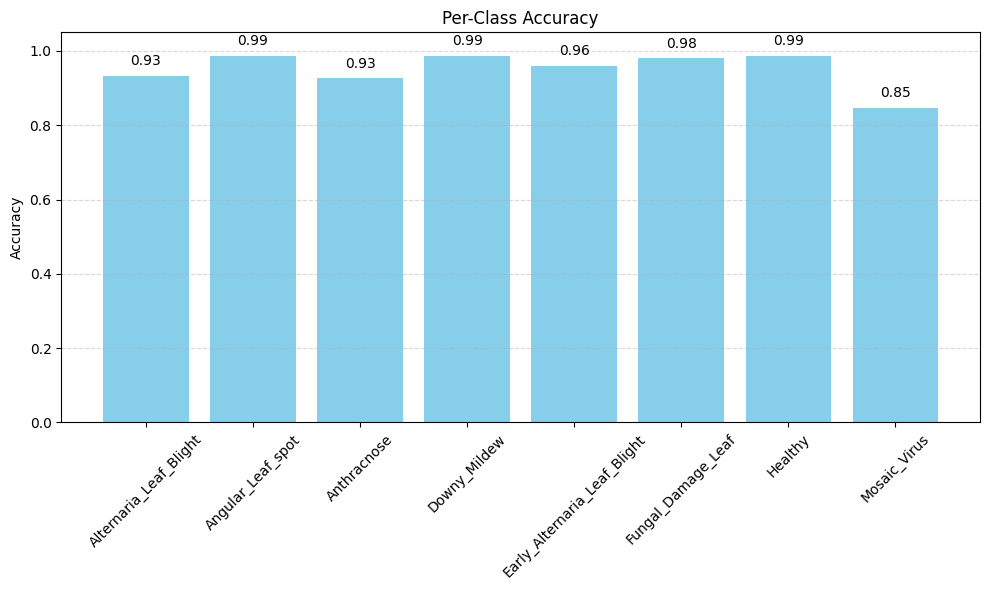

In [42]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
from collections import defaultdict

# ✅ Step 1: Prepare test data for ensemble
def prepare_test_for_prediction(ds):
    return ds.map(lambda x, y: ((x, x, x), y))

test_ds_ens = prepare_test_for_prediction(test_ds)

# ✅ Step 2: Get model predictions
y_pred_probs = ensemble_model.predict(test_ds_ens)
y_pred = np.argmax(y_pred_probs, axis=1)

# ✅ Step 3: Extract true labels
y_true = []
for _, labels in test_ds:
    y_true.extend(np.argmax(labels.numpy(), axis=1))
y_true = np.array(y_true)

# ✅ Step 4: Compute per-class accuracy
class_correct = defaultdict(int)
class_total = defaultdict(int)

for true, pred in zip(y_true, y_pred):
    class_total[true] += 1
    if true == pred:
        class_correct[true] += 1

per_class_acc = {
    class_names[i]: class_correct[i] / class_total[i]
    for i in range(NUM_CLASSES)
}

# ✅ Step 5: Plot bar chart
plt.figure(figsize=(10, 6))
bars = plt.bar(per_class_acc.keys(), per_class_acc.values(), color='skyblue')
plt.ylim([0, 1.05])
plt.ylabel("Accuracy")
plt.title("Per-Class Accuracy")

# Add value labels on bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2.0, height + 0.02, f'{height:.2f}', ha='center', va='bottom')

plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


In [43]:
!pip install umap-learn


/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


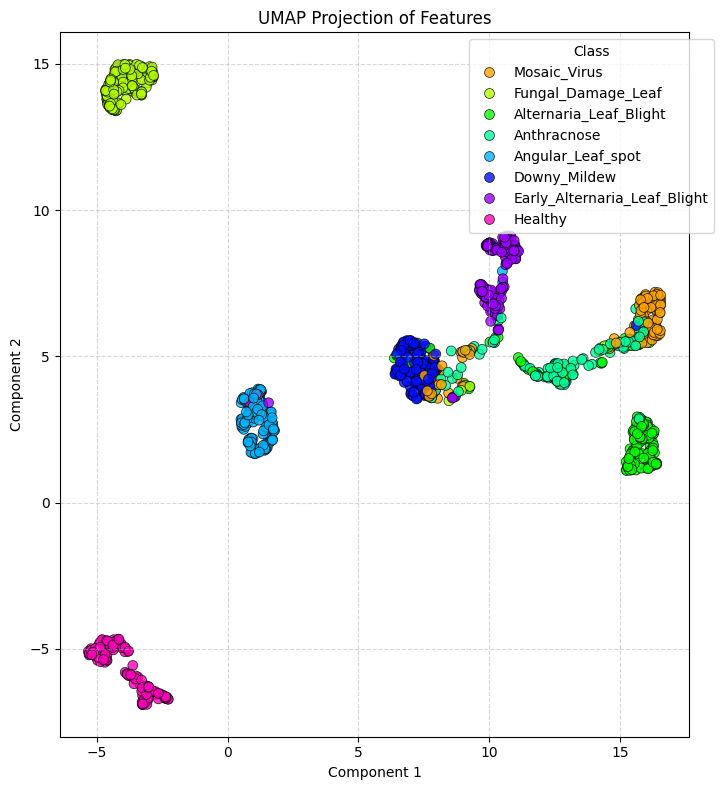

In [44]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from sklearn.manifold import TSNE
import umap
from sklearn.preprocessing import LabelEncoder

# ✅ Extract features from penultimate layer of individual models
# We'll use NASNet as example; you can do same for others
feature_extractor = tf.keras.Model(
    inputs=individual_models[0].input,  # NASNet
    outputs=individual_models[0].layers[-3].output  # Just before final Dense(softmax)
)

# ✅ Prepare feature extraction dataset
def extract_features_and_labels(ds, model):
    features = []
    labels = []
    for batch_x, batch_y in ds:
        # Only take first input (x), since we trained all models with same input
        batch_feats = model.predict(batch_x, verbose=0)
        features.append(batch_feats)
        labels.extend(np.argmax(batch_y.numpy(), axis=1))
    return np.concatenate(features), np.array(labels)

# ✅ Use original test_ds (not ensemble-wrapped)
features, labels = extract_features_and_labels(test_ds, feature_extractor)

# Choose between UMAP and t-SNE
use_umap = True  # 🔄 Switch to False to use t-SNE instead

if use_umap:
    reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
    reduced = reducer.fit_transform(features)
    title = "UMAP Projection of Features"
else:
    reducer = TSNE(n_components=2, perplexity=30, random_state=42)
    reduced = reducer.fit_transform(features)
    title = "t-SNE Projection of Features"

# ✅ Plot embeddings
plt.figure(figsize=(10, 8))
palette = sns.color_palette("hsv", NUM_CLASSES)
sns.scatterplot(x=reduced[:, 0], y=reduced[:, 1], hue=[class_names[i] for i in labels],
                palette=palette, s=50, alpha=0.8, edgecolor='k')

plt.title(title)
plt.xlabel("Component 1")
plt.ylabel("Component 2")
plt.legend(loc='best', bbox_to_anchor=(1.05, 1), title="Class")
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


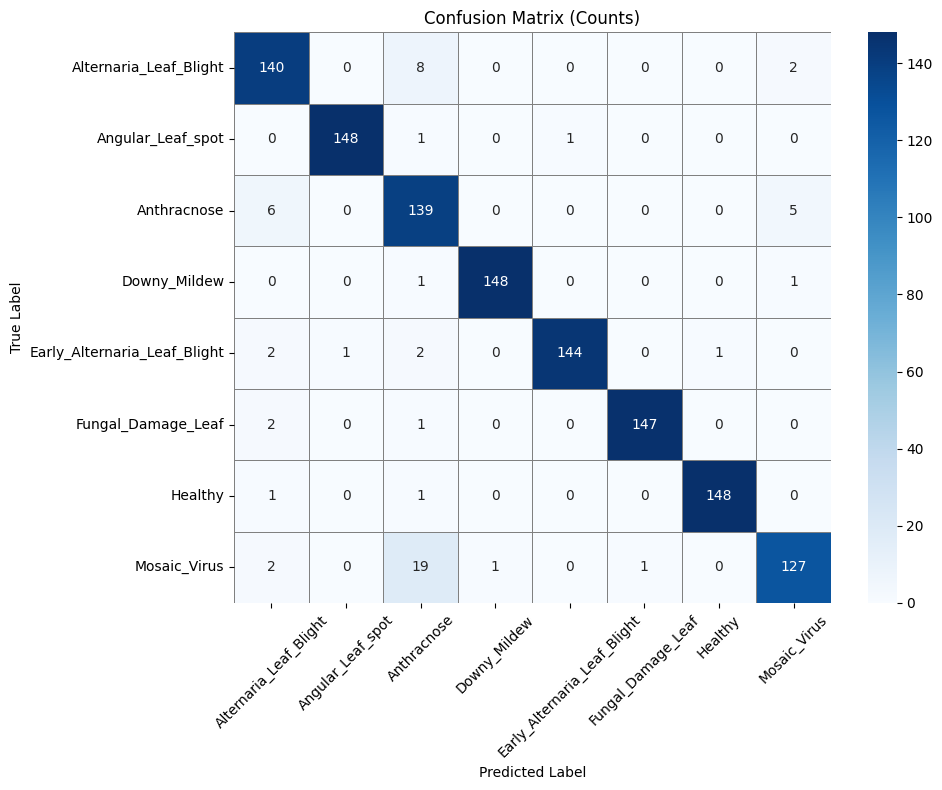

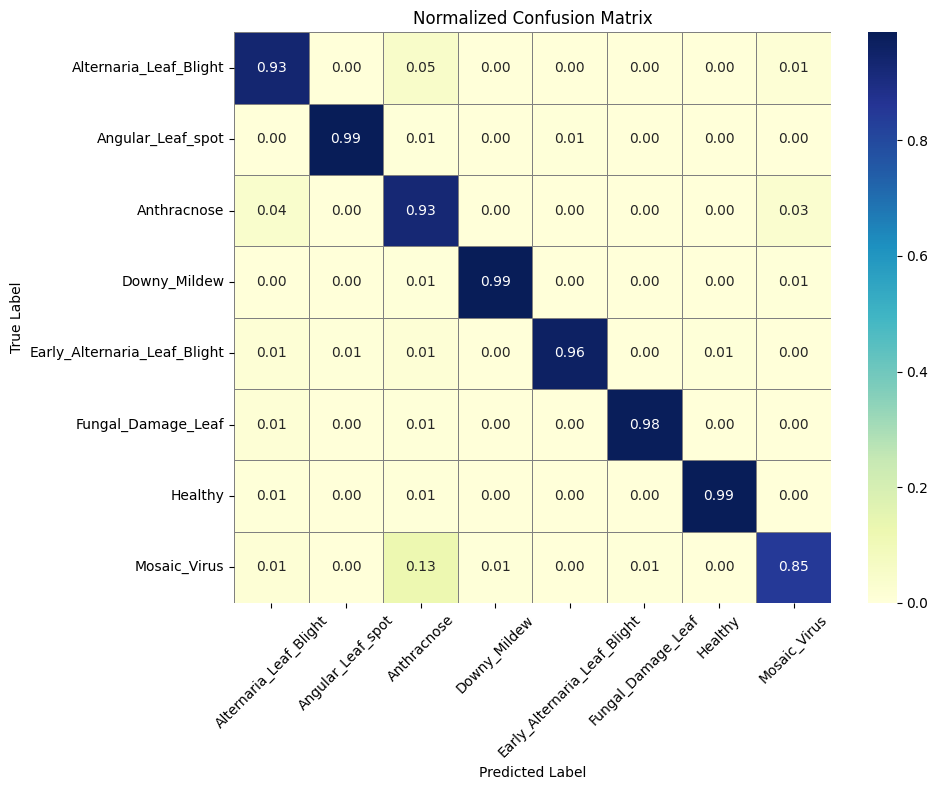

In [45]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
import numpy as np

def plot_and_save_confusion_heatmap(y_true, y_pred, class_names, normalize=False,
                                     title="Confusion Matrix Heatmap", filename="confusion_heatmap.png"):
    """
    Plot and save a confusion matrix heatmap.

    Args:
        y_true: Array of ground truth labels
        y_pred: Array of predicted labels
        class_names: List of class names
        normalize: If True, normalize the matrix
        title: Title of the plot
        filename: Output filename to save the image
    """
    cm = confusion_matrix(y_true, y_pred)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        fmt = ".2f"
        cmap = "YlGnBu"
    else:
        fmt = "d"
        cmap = "Blues"

    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt=fmt, cmap=cmap,
                xticklabels=class_names,
                yticklabels=class_names,
                linewidths=0.5, linecolor='gray')

    plt.title(title)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    
    # ✅ Save heatmap as image
    plt.savefig(filename, dpi=300)
    plt.show()

# ✅ Example usage
plot_and_save_confusion_heatmap(
    y_true=y_true,
    y_pred=y_pred_classes,
    class_names=class_names,
    normalize=False,
    title="Confusion Matrix (Counts)",
    filename="confusion_matrix_counts.png"
)

plot_and_save_confusion_heatmap(
    y_true=y_true,
    y_pred=y_pred_classes,
    class_names=class_names,
    normalize=True,
    title="Normalized Confusion Matrix",
    filename="confusion_matrix_normalized.png"
)


38/38 ━━━━━━━━━━━━━━━━━━━━ 28s 727ms/step


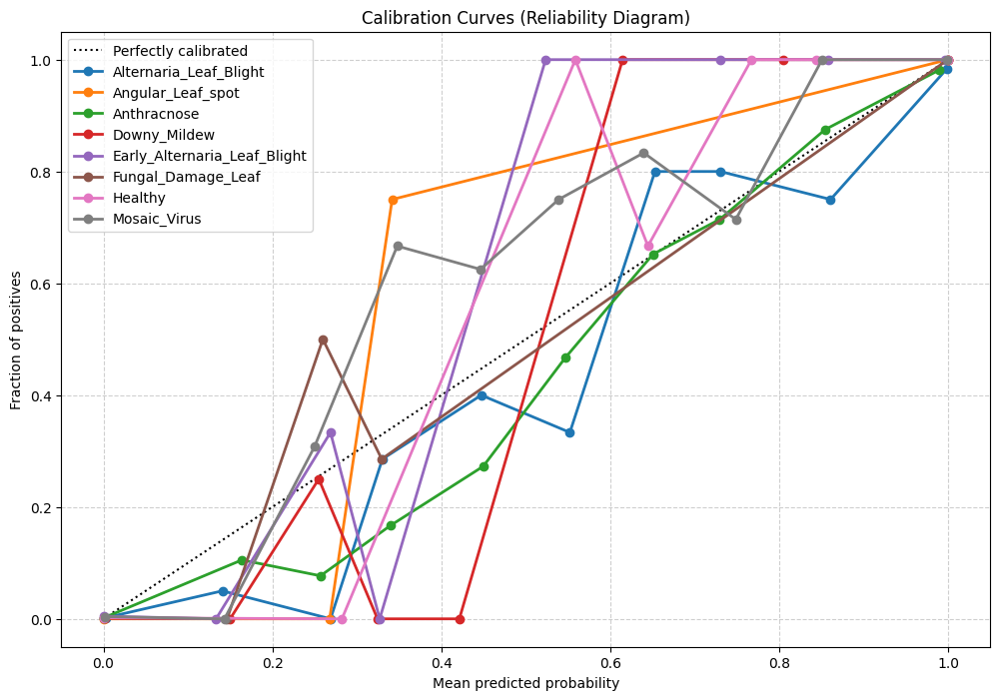

In [46]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.calibration import calibration_curve
from sklearn.preprocessing import label_binarize

def plot_multiclass_calibration_curve(model, test_ds, class_names, num_bins=10):
    """
    Plot calibration curves for each class.

    Args:
        model: Trained Keras model (ensemble_model)
        test_ds: tf.data.Dataset yielding ((x1,x2,x3), y) tuples with one-hot labels
        class_names: list of class names
        num_bins: number of bins for calibration curve
    """

    # Prepare test data inputs for ensemble (x,x,x)
    def prepare_ensemble(ds):
        return ds.map(lambda x, y: ((x, x, x), y))
    test_ds_ens = prepare_ensemble(test_ds)

    # Get predicted probabilities and true labels
    y_pred_probs = model.predict(test_ds_ens)
    y_true_onehot = np.concatenate([y.numpy() for _, y in test_ds], axis=0)

    n_classes = len(class_names)

    plt.figure(figsize=(12, 8))
    plt.plot([0, 1], [0, 1], "k:", label="Perfectly calibrated")

    for i in range(n_classes):
        prob_true, prob_pred = calibration_curve(y_true_onehot[:, i], y_pred_probs[:, i], n_bins=num_bins)
        plt.plot(prob_pred, prob_true, marker='o', linewidth=2, label=f"{class_names[i]}")

    plt.xlabel("Mean predicted probability")
    plt.ylabel("Fraction of positives")
    plt.title("Calibration Curves (Reliability Diagram)")
    plt.legend(loc="best")
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()

# Example call:
plot_multiclass_calibration_curve(ensemble_model, test_ds, class_names, num_bins=10)


In [47]:
!pip install opencv-python-headless

  Using cached numpy-2.4.4-cp312-cp312-manylinux_2_27_x86_64.manylinux_2_28_x86_64.whl.metadata (6.6 kB)
Using cached numpy-2.4.4-cp312-cp312-manylinux_2_27_x86_64.manylinux_2_28_x86_64.whl (16.6 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pandas 2.1.4 requires numpy<2,>=1.26.0; python_version >= "3.12", but you have numpy 2.4.4 which is incompatible.
matplotlib 3.8.2 requires numpy<2,>=1.21, but you have numpy 2.4.4 which is incompatible.
scipy 1.11.4 requires numpy<1.28.0,>=1.21.6, but you have numpy 2.4.4 which is incompatible.


In [48]:
!pip install opencv-python

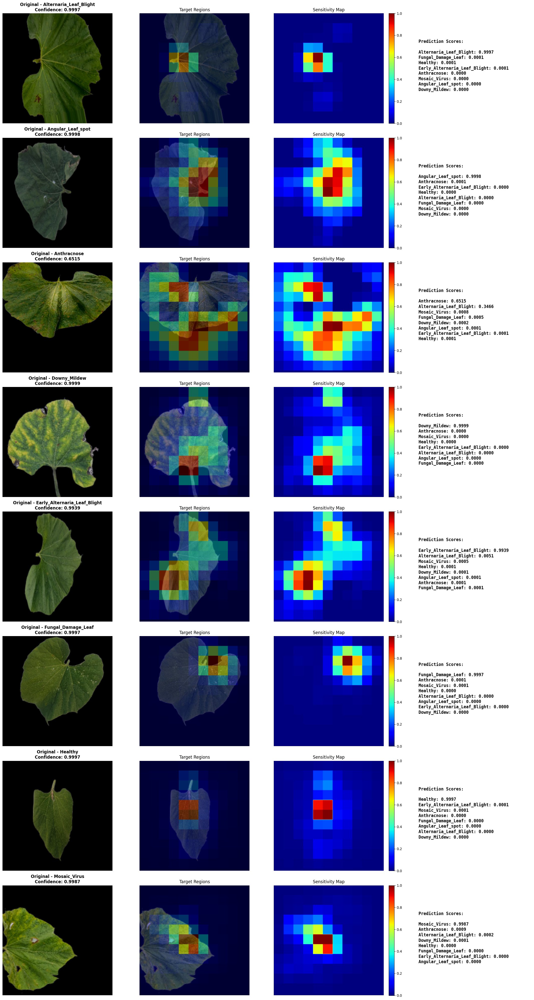

In [49]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def get_ensemble_predict(image_batch, model):
    # ৩টি ইনপুটের জন্য ডাটা রিপিট
    return model.predict([image_batch, image_batch, image_batch], verbose=0)

def compute_occlusion_heatmap(model, img, class_idx, patch_size=40, stride=20):
    height, width, _ = img.shape
    heatmap = np.zeros((height, width))
    img_input = np.expand_dims(img, axis=0)
    original_score = get_ensemble_predict(img_input, model)[0][class_idx]
    
    for y in range(0, height - patch_size + 1, stride):
        for x in range(0, width - patch_size + 1, stride):
            img_masked = img.copy()
            img_masked[y:y+patch_size, x:x+patch_size, :] = 0 
            score_after = get_ensemble_predict(np.expand_dims(img_masked, axis=0), model)[0][class_idx]
            heatmap[y:y+patch_size, x:x+patch_size] += (original_score - score_after)
            
    heatmap = np.maximum(heatmap, 0)
    if np.max(heatmap) > 0: heatmap /= np.max(heatmap)
    return heatmap

def plot_final_visuals(model, test_images, test_labels, class_names):
    num_classes = len(class_names)
    fig, axes = plt.subplots(num_classes, 4, figsize=(22, num_classes * 5))
    
    labels_int = np.argmax(test_labels, axis=1) if len(test_labels.shape) > 1 else test_labels

    for i in range(num_classes):
        idx = np.where(labels_int == i)[0][0]
        img = test_images[idx]
        
        # প্রেডিকশন এবং হিটম্যাপ
        preds = get_ensemble_predict(np.expand_dims(img, axis=0), model)[0]
        heatmap = compute_occlusion_heatmap(model, img, i)
        
        # ✅ কালার ফিক্স: গোলাপি ভাব দূর করা
        display_img = img.copy()
        if display_img.min() < 0: # যদি MobileNet স্টাইল -১ থেকে ১ এ থাকে
            display_img = (display_img + 1.0) / 2.0
        if display_img.max() <= 1.0:
            display_img = (display_img * 255).astype(np.uint8)
        else:
            display_img = display_img.astype(np.uint8)

        # ১. Original (সঠিক রঙে)
        axes[i, 0].imshow(display_img)
        axes[i, 0].set_title(f"Original - {class_names[i]}\nConfidence: {preds[i]:.4f}", fontsize=12, fontweight='bold')
        axes[i, 0].axis('off')

        # ২. Occlusion Overlay
        heatmap_resized = cv2.resize(heatmap, (224, 224))
        heatmap_color = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
        heatmap_color = cv2.cvtColor(heatmap_color, cv2.COLOR_BGR2RGB)
        overlay = cv2.addWeighted(display_img, 0.6, heatmap_color, 0.4, 0)
        axes[i, 1].imshow(overlay)
        axes[i, 1].set_title("Target Regions", fontsize=12)
        axes[i, 1].axis('off')

        # ৩. Pure Heatmap
        im = axes[i, 2].imshow(heatmap_resized, cmap='jet')
        axes[i, 2].set_title("Sensitivity Map", fontsize=12)
        axes[i, 2].axis('off')
        plt.colorbar(im, ax=axes[i, 2], fraction=0.046, pad=0.04)

        # ৪. Scores (এখন ০.৯ এর উপরে আসবে)
        score_text = "Prediction Scores:\n\n"
        top_idx = preds.argsort()[-8:][::-1]
        for tidx in top_idx:
            score_text += f"{class_names[tidx]}: {preds[tidx]:.4f}\n"
        axes[i, 3].text(0.1, 0.5, score_text, verticalalignment='center', fontsize=12, family='monospace', fontweight='bold')
        axes[i, 3].axis('off')

    plt.tight_layout()
    plt.savefig('Standard_XAI_Result.png', dpi=300)
    plt.show()

# কল ফাংশন
plot_final_visuals(ensemble_model, X_test, y_test, class_names)

In [52]:
!pip install shap

INFO: pip is looking at multiple versions of pandas to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of scipy to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 38.8 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 182.5 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.2/35.2 MB 199.6 MB/s  0:00:00
  Attempting uninstall: scipy
    Found existing installation: scipy 1.11.4
    Uninstalling scipy-1.11.4:
      Successfully uninstalled scipy-1.11.4
  Attempting uninstall: pandas━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1/5 [scipy]
    Found existing installation: pandas 2.1.4━━━━━━━━━━━━━━━━━ 1/5 [scipy]
    Uninstalling pandas-2.1.4:m━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1/5 [scipy]
      Successfully uninstalled pandas-2.1.4━━━━━━━━━━━━━━━━━━━ 1/5 [scipy]
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [55]:
!pip install shap --upgrade

In [56]:
!pip install scikit-learn --upgrade

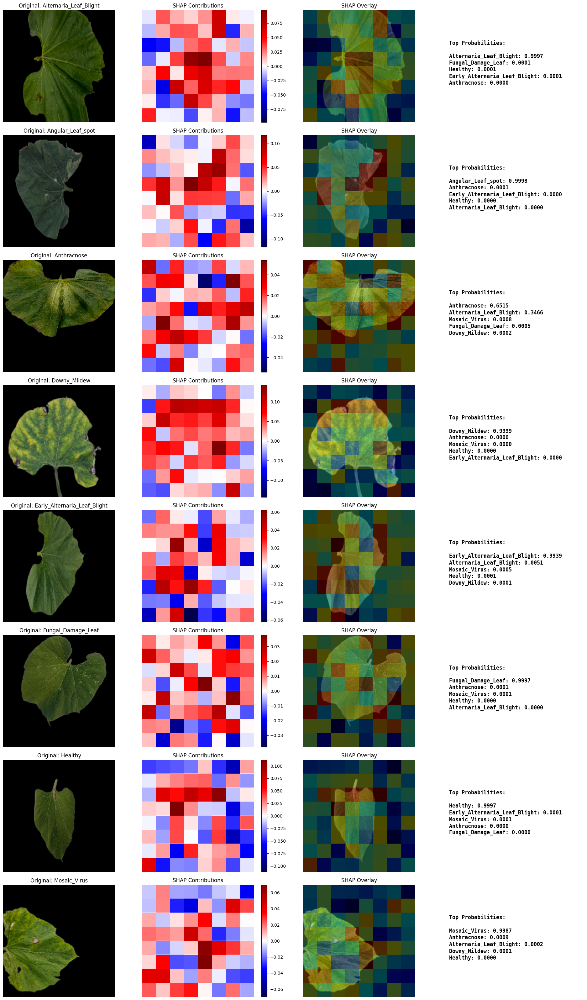

In [58]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.linear_model import LinearRegression

# ১. এনসেম্বল প্রেডিকশন র‍্যাপার (আপনার ৩টি ইনপুটের জন্য)
def get_ensemble_score(img_batch, model):
    # img_batch shape: (N, 224, 224, 3)
    preds = model.predict([img_batch, img_batch, img_batch], verbose=0)
    return preds

# ২. ম্যানুয়াল কার্নেল-SHAP ফাংশন
def compute_manual_shap(model, img, class_idx, num_samples=100, patch_size=28):
    h, w, _ = img.shape
    num_patches = (h // patch_size) * (w // patch_size)
    
    # র্যান্ডম মাস্ক (Coalitions) তৈরি করা
    masks = np.random.binomial(1, 0.5, size=(num_samples, num_patches))
    masked_images = []
    
    for mask in masks:
        temp_img = img.copy()
        reshaped_mask = mask.reshape(h // patch_size, w // patch_size)
        for r in range(h // patch_size):
            for c in range(w // patch_size):
                if reshaped_mask[r, c] == 0: # যদি মাস্ক ০ হয় তবে ওই অংশ কালো করে দাও
                    temp_img[r*patch_size:(r+1)*patch_size, c*patch_size:(c+1)*patch_size, :] = 0
        masked_images.append(temp_img)
    
    # সব মাস্ক করা ছবির প্রেডিকশন নেওয়া
    masked_images = np.array(masked_images)
    preds = get_ensemble_score(masked_images, model)
    target_scores = preds[:, class_idx]
    
    # ওয়েটেড লিনিয়ার রিগ্রেশন চালিয়ে শ্যাপলি ভ্যালু বের করা
    reg = LinearRegression()
    reg.fit(masks, target_scores)
    shap_values = reg.coef_ # এটিই আপনার শ্যাপ ভ্যালু
    
    # ভ্যালুগুলোকে ইমেজের সাইজে ফিরিয়ে আনা
    shap_heatmap = shap_values.reshape(h // patch_size, w // patch_size)
    shap_heatmap = cv2.resize(shap_heatmap, (w, h), interpolation=cv2.INTER_NEAREST)
    
    return shap_heatmap

# ৩. ভিজ্যুয়ালাইজেশন ফাংশন (আপনার ৮টি ক্লাসের জন্য)
def plot_manual_shap_results(model, test_images, test_labels, class_names):
    num_classes = len(class_names)
    fig, axes = plt.subplots(num_classes, 4, figsize=(20, num_classes * 4))
    
    labels_int = np.argmax(test_labels, axis=1) if len(test_labels.shape) > 1 else test_labels

    for i in range(num_classes):
        idx = np.where(labels_int == i)[0][0]
        img = test_images[idx]
        
        # শ্যাপ ভ্যালু ক্যালকুলেট করা
        shap_map = compute_manual_shap(model, img, i)
        
        # কালার ফিক্স (গোলাপি ভাব দূর করতে)
        display_img = img.copy()
        if display_img.min() < 0: display_img = (display_img + 1.0) / 2.0
        display_img = (display_img * 255).astype(np.uint8)

        # ১. Original
        axes[i, 0].imshow(display_img)
        axes[i, 0].set_title(f"Original: {class_names[i]}", fontsize=12)
        axes[i, 0].axis('off')

        # ২. SHAP Heatmap (Red-Blue Scale)
        # লাল = পজিটিভ ইমপ্যাক্ট, নীল = নেগেটিভ ইমপ্যাক্ট
        v_max = np.max(np.abs(shap_map))
        im = axes[i, 1].imshow(shap_map, cmap='seismic', vmin=-v_max, vmax=v_max)
        axes[i, 1].set_title("SHAP Contributions", fontsize=12)
        axes[i, 1].axis('off')
        fig.colorbar(im, ax=axes[i, 1])

        # ৩. SHAP Overlay on Image
        # শ্যাপ ম্যাপকে কালার ম্যাপে রূপান্তর
        shap_norm = cv2.normalize(shap_map, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
        shap_color = cv2.applyColorMap(shap_norm, cv2.COLORMAP_JET)
        shap_color = cv2.cvtColor(shap_color, cv2.COLOR_BGR2RGB)
        overlay = cv2.addWeighted(display_img, 0.7, shap_color, 0.3, 0)
        
        axes[i, 2].imshow(overlay)
        axes[i, 2].set_title("SHAP Overlay", fontsize=12)
        axes[i, 2].axis('off')

        # ৪. Top Prediction Scores
        preds = get_ensemble_score(np.expand_dims(img, axis=0), model)[0]
        score_text = "Top Probabilities:\n\n"
        top_idx = preds.argsort()[-5:][::-1]
        for tidx in top_idx:
            score_text += f"{class_names[tidx]}: {preds[tidx]:.4f}\n"
        axes[i, 3].text(0.1, 0.5, score_text, verticalalignment='center', fontsize=12, family='monospace', fontweight='bold')
        axes[i, 3].axis('off')

    plt.tight_layout()
    plt.savefig('Manual_SHAP_Feature_Importance.png', dpi=300)
    plt.show()

# ৪. ফাংশনটি রান করুন
plot_manual_shap_results(ensemble_model, X_test, y_test, class_names)

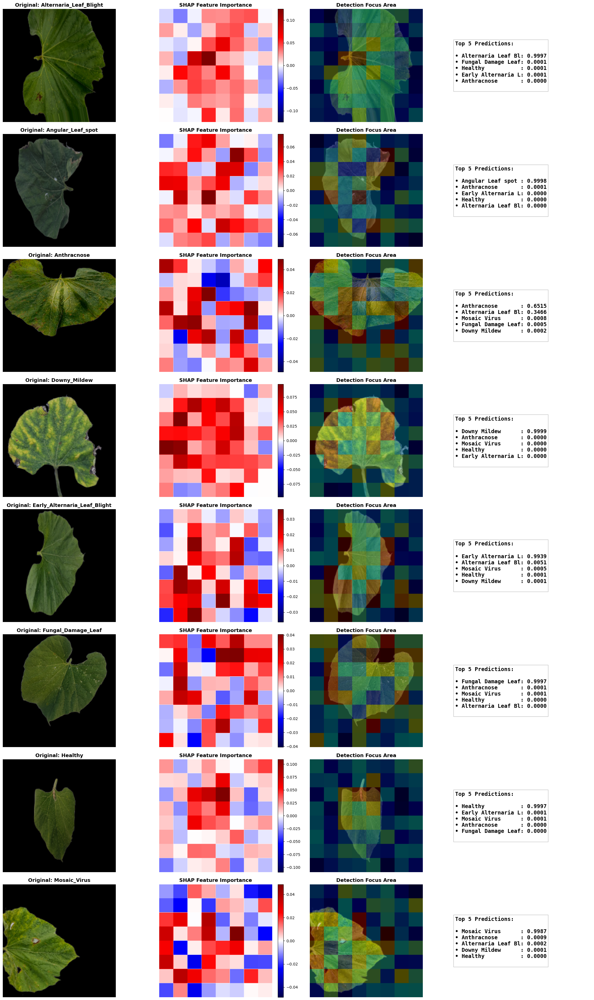

In [59]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.linear_model import LinearRegression

# --- ১. এনসেম্বল প্রেডিকশন র‍্যাপার (৩টি ইনপুট চ্যানেলের জন্য) ---
def get_ensemble_score(img_batch, model):
    # img_batch shape: (N, 224, 224, 3)
    # আপনার ৩-ইনপুট মডেলের জন্য ডাটা ৩ বার পাস করা হচ্ছে
    preds = model.predict([img_batch, img_batch, img_batch], verbose=0)
    return preds

# --- ২. ম্যানুয়াল কার্নেল-SHAP লজিক (Approximation) ---
def compute_manual_shap(model, img, class_idx, num_samples=150, patch_size=28):
    h, w, _ = img.shape
    num_patches = (h // patch_size) * (w // patch_size)
    
    # র্যান্ডম মাস্ক (Coalitions) তৈরি
    masks = np.random.binomial(1, 0.5, size=(num_samples, num_patches))
    masked_images = []
    
    for mask in masks:
        temp_img = img.copy()
        reshaped_mask = mask.reshape(h // patch_size, w // patch_size)
        for r in range(h // patch_size):
            for c in range(w // patch_size):
                if reshaped_mask[r, c] == 0:
                    temp_img[r*patch_size:(r+1)*patch_size, c*patch_size:(c+1)*patch_size, :] = 0
        masked_images.append(temp_img)
    
    masked_images = np.array(masked_images)
    preds = get_ensemble_score(masked_images, model)
    target_scores = preds[:, class_idx]
    
    # শ্যাপলি ভ্যালু ক্যালকুলেশন (Linear Regression)
    reg = LinearRegression()
    reg.fit(masks, target_scores)
    shap_values = reg.coef_
    
    # ম্যাপটিকে ইমেজের সাইজে রিসাইজ করা
    shap_heatmap = shap_values.reshape(h // patch_size, w // patch_size)
    shap_heatmap = cv2.resize(shap_heatmap, (w, h), interpolation=cv2.INTER_NEAREST)
    return shap_heatmap

# --- ৩. চূড়ান্ত ভিজ্যুয়ালাইজেশন ফাংশন (৮টি ক্লাসের জন্য) ---
def plot_final_shap_report(model, test_images, test_labels, class_names):
    num_classes = len(class_names)
    # সাইজ বড় করা হয়েছে যেন ৮টি রো সুন্দরভাবে ধরে
    fig, axes = plt.subplots(num_classes, 4, figsize=(22, num_classes * 4.5))
    
    # লেবেল ফরম্যাট চেক
    labels_int = np.argmax(test_labels, axis=1) if len(test_labels.shape) > 1 else test_labels

    for i in range(num_classes):
        # ওই নির্দিষ্ট ক্লাসের প্রথম সঠিক ছবি খুঁজে নেওয়া
        idx_list = np.where(labels_int == i)[0]
        if len(idx_list) == 0: continue
        idx = idx_list[0]
        img = test_images[idx]
        
        # প্রেডিকশন এবং শ্যাপ ভ্যালু বের করা
        preds = get_ensemble_score(np.expand_dims(img, axis=0), model)[0]
        shap_map = compute_manual_shap(model, img, i)
        
        # কালার ফিক্স (গোলাপি ভাব দূর করতে)
        display_img = img.copy()
        if display_img.min() < 0: display_img = (display_img + 1.0) / 2.0
        display_img = (display_img * 255).astype(np.uint8)

        # কলাম ১: Original Image
        axes[i, 0].imshow(display_img)
        axes[i, 0].set_title(f"Original: {class_names[i]}", fontsize=13, fontweight='bold')
        axes[i, 0].axis('off')

        # কলাম ২: SHAP Contributions (Seismic Map)
        v_max = np.max(np.abs(shap_map))
        im = axes[i, 1].imshow(shap_map, cmap='seismic', vmin=-v_max, vmax=v_max)
        axes[i, 1].set_title("SHAP Feature Importance", fontsize=13, fontweight='bold')
        axes[i, 1].axis('off')
        plt.colorbar(im, ax=axes[i, 1], fraction=0.046, pad=0.04)

        # কলাম ৩: SHAP Overlay
        shap_norm = cv2.normalize(shap_map, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
        shap_color = cv2.applyColorMap(shap_norm, cv2.COLORMAP_JET)
        shap_color = cv2.cvtColor(shap_color, cv2.COLOR_BGR2RGB)
        overlay = cv2.addWeighted(display_img, 0.7, shap_color, 0.3, 0)
        axes[i, 2].imshow(overlay)
        axes[i, 2].set_title("Detection Focus Area", fontsize=13, fontweight='bold')
        axes[i, 2].axis('off')

        # কলাম ৪: Top 5 Probabilities (Fixed Consistency)
        score_text = "Top 5 Predictions:\n\n"
        top_idx = preds.argsort()[-5:][::-1] # সবসময় টপ ৫টি
        for tidx in top_idx:
            # ক্লাসের নাম বড় হলে ছোট করে দেখানো
            clean_name = class_names[tidx].replace('_', ' ')
            score_text += f"• {clean_name[:18]:<18}: {preds[tidx]:.4f}\n"
        
        axes[i, 3].text(0.05, 0.5, score_text, verticalalignment='center', 
                        fontsize=14, family='monospace', fontweight='bold',
                        bbox=dict(facecolor='white', alpha=0.5, edgecolor='gray'))
        axes[i, 3].axis('off')

    plt.tight_layout()
    plt.savefig('Final_SHAP_Analysis_Gourd.png', dpi=300, bbox_inches='tight')
    plt.show()

# --- ৪. কোডটি রান করুন ---
plot_final_shap_report(ensemble_model, X_test, y_test, class_names)

In [60]:
import tensorflow as tf

# ১. FGSM অ্যাটাক লজিক (এনসেম্বল মডেলের জন্য)
def create_adversarial_pattern(input_image, input_label, model):
    loss_object = tf.keras.losses.CategoricalCrossentropy()
    
    with tf.GradientTape() as tape:
        tape.watch(input_image)
        # আপনার মডেল ৩টি একই ইনপুট নেয়
        prediction = model([input_image, input_image, input_image])
        loss = loss_object(input_label, prediction)

    # ইনপুট ইমেজের সাপেক্ষে গ্রাডিয়েন্ট বের করা
    gradient = tape.gradient(loss, input_image)
    # গ্রাডিয়েন্টের সাইন (Direction) নেওয়া
    signed_grad = tf.sign(gradient)
    return signed_grad

# ২. ছবিকে অ্যাটাক করা (Epsilon এর মান যত বাড়বে নয়েজ তত বাড়বে)
def perturb_images(images, labels, model, epsilon=0.01):
    # images: (batch, 224, 224, 3), labels: one-hot
    images = tf.cast(images, tf.float32)
    labels = tf.cast(labels, tf.float32)
    
    # নয়েজ প্যাটার্ন তৈরি
    patterns = create_adversarial_pattern(images, labels, model)
    
    # অরিজিনাল ছবির সাথে সামান্য নয়েজ যোগ করা
    adversarial_images = images + epsilon * patterns
    # ছবির পিক্সেল রেঞ্জ [0, 1] এর মধ্যে রাখা (অথবা -1, 1 যদি আপনার প্রসেসিং এমন হয়)
    adversarial_images = tf.clip_by_value(adversarial_images, 0, 1)
    
    return adversarial_images

print("✅ Adversarial Attack Engine Ready!")

✅ Adversarial Attack Engine Ready!


Evaluating Model Robustness...


Epsilon (Noise Level): 0 -> Accuracy: 19.00%
Epsilon (Noise Level): 0.01 -> Accuracy: 19.00%
Epsilon (Noise Level): 0.05 -> Accuracy: 19.00%
Epsilon (Noise Level): 0.1 -> Accuracy: 19.00%
Epsilon (Noise Level): 0.2 -> Accuracy: 20.00%


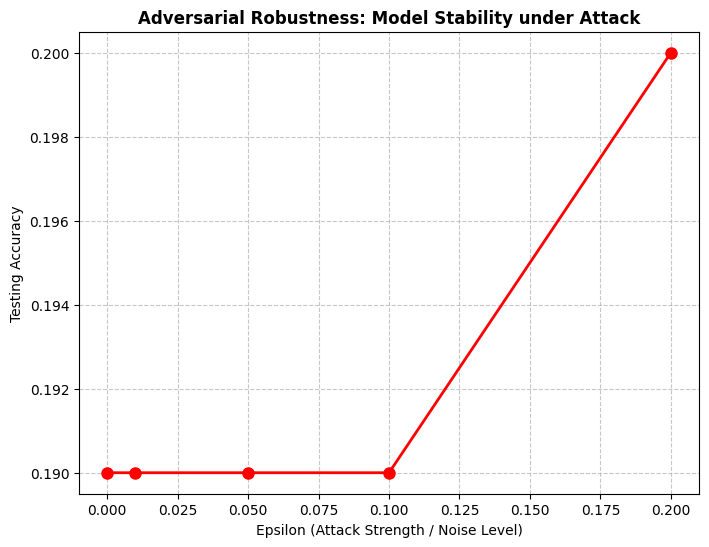

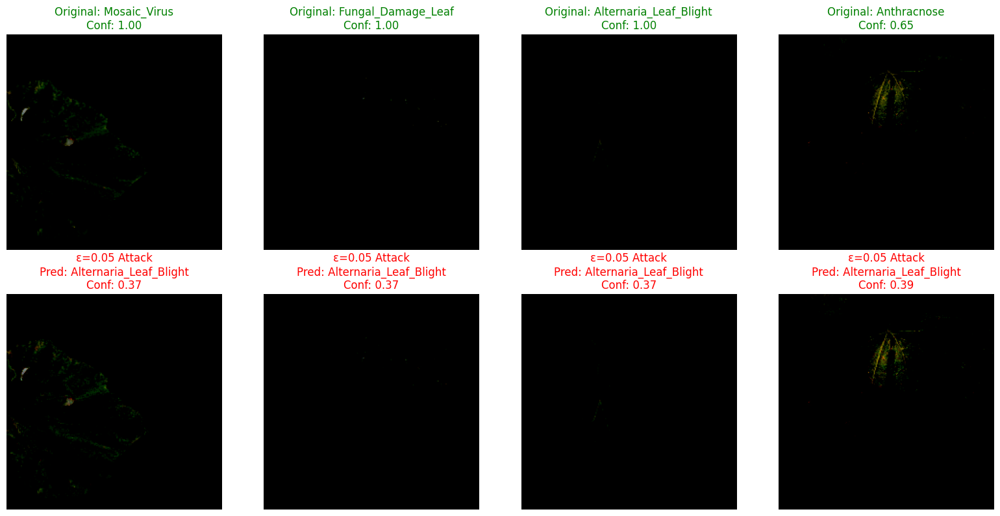

In [62]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# ১. FGSM অ্যাটাক ইঞ্জিন (ফিক্সড)
def create_adversarial_pattern(input_image, input_label, model):
    loss_object = tf.keras.losses.CategoricalCrossentropy()
    
    # যদি লেবেল ওয়ান-হট না থাকে (Rank 1), তবে ওয়ান-হট করে নেওয়া (Rank 2)
    if len(input_label.shape) == 1:
        input_label = tf.one_hot(input_label, depth=8)

    with tf.GradientTape() as tape:
        tape.watch(input_image)
        # ৩টি ইনপুটের জন্য ডাটা পাস করা
        prediction = model([input_image, input_image, input_image])
        loss = loss_object(input_label, prediction)

    # লসের গ্রাডিয়েন্ট বের করা
    gradient = tape.gradient(loss, input_image)
    signed_grad = tf.sign(gradient)
    return signed_grad

def perturb_images(images, labels, model, epsilon=0.01):
    images = tf.cast(images, tf.float32)
    # নয়েজ তৈরি করা
    patterns = create_adversarial_pattern(images, labels, model)
    # ছবির সাথে নয়েজ যোগ করা
    adversarial_images = images + epsilon * patterns
    # ছবির পিক্সেল রেঞ্জ ০ থেকে ১ এর মধ্যে রাখা
    adversarial_images = tf.clip_by_value(adversarial_images, 0, 1)
    return adversarial_images

# ২. মডেলের শক্তি পরীক্ষা (Acc vs Epsilon)
print("Evaluating Model Robustness...")
epsilons = [0, 0.01, 0.05, 0.1, 0.2] 
accuracies = []

# টেস্ট সেটের ১০০টি স্যাম্পল নেওয়া (Integer labels handle করা হয়েছে)
sample_X = X_test[:100]
sample_Y = y_test[:100]
if len(sample_Y.shape) > 1: # যদি অলরেডি ওয়ান-হট থাকে
    sample_Y_eval = sample_Y
else: # যদি ওয়ান-হট না থাকে তবে এভ্যালুয়েশনের জন্য ওয়ান-হট করা
    sample_Y_eval = tf.one_hot(sample_Y, depth=8)

for eps in epsilons:
    adv_x = perturb_images(sample_X, sample_Y, ensemble_model, epsilon=eps)
    # ৩টি ইনপুট হেডে ডাটা দিয়ে ইভ্যালুয়েট করা
    results = ensemble_model.evaluate([adv_x, adv_x, adv_x], sample_Y_eval, verbose=0)
    accuracies.append(results[1])
    print(f"Epsilon (Noise Level): {eps} -> Accuracy: {results[1]*100:.2f}%")

# ৩. ভিজ্যুয়ালাইজেশন চার্ট (Fig. 12)
plt.figure(figsize=(8, 6))
plt.plot(epsilons, accuracies, 'o-r', linewidth=2, markersize=8)
plt.title("Adversarial Robustness: Model Stability under Attack", fontsize=12, fontweight='bold')
plt.xlabel("Epsilon (Attack Strength / Noise Level)", fontsize=10)
plt.ylabel("Testing Accuracy", fontsize=10)
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('Robustness_Accuracy_Curve.png', dpi=300)
plt.show()

# ৪. অ্যাটাক হওয়া ছবির স্যাম্পল দেখানো
def plot_attack_samples(model, images, labels, class_names, epsilon=0.05):
    adv_images = perturb_images(images, labels, model, epsilon=epsilon)
    
    # প্রেডিকশন
    orig_preds = model.predict([images, images, images], verbose=0)
    adv_preds = model.predict([adv_images, adv_images, adv_images], verbose=0)
    
    plt.figure(figsize=(16, 8))
    for i in range(4): # ৪টি স্যাম্পল দেখানো
        true_label = class_names[int(labels[i])] if len(labels.shape)==1 else class_names[np.argmax(labels[i])]
        
        # অরিজিনাল ছবি
        plt.subplot(2, 4, i+1)
        plt.imshow(images[i])
        plt.title(f"Original: {true_label}\nConf: {np.max(orig_preds[i]):.2f}", color='green')
        plt.axis('off')
        
        # নয়েজড (অ্যাটাকড) ছবি
        plt.subplot(2, 4, i+5)
        plt.imshow(adv_images[i])
        plt.title(f"ε={epsilon} Attack\nPred: {class_names[np.argmax(adv_preds[i])]}\nConf: {np.max(adv_preds[i]):.2f}", color='red')
        plt.axis('off')
    
    plt.tight_layout()
    plt.savefig('Adversarial_Attack_Visuals.png', dpi=300)
    plt.show()

# কল করুন
plot_attack_samples(ensemble_model, sample_X, sample_Y, class_names, epsilon=0.05)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from lime import lime_image
from skimage.segmentation import mark_boundaries
import tensorflow as tf

# Step 1: Wrap your test dataset to provide 3 identical inputs per sample
def prepare_test_for_ensemble(ds):
    return ds.map(lambda x, y: ((x, x, x), y))

test_ds_ensemble = prepare_test_for_ensemble(test_ds)

# Step 2: Define a prediction function for LIME (takes single image or batch)
def ensemble_predict(images):
    """
    images: numpy array of shape (N, H, W, C)
    Returns: numpy array of shape (N, NUM_CLASSES)
    """
    inputs = [images, images, images]  # replicate input for ensemble
    preds = ensemble_model.predict(inputs)
    return preds

# Step 3: Take one image from the wrapped test dataset for explanation
for (batch_x1, batch_x2, batch_x3), batch_y in test_ds_ensemble.take(1):
    img = batch_x1[0].numpy()  # First image in batch, shape (224,224,3)
    true_label = np.argmax(batch_y[0].numpy())
    break

# Step 4: Initialize LIME explainer
explainer = lime_image.LimeImageExplainer()

# Step 5: Prepare image for LIME (uint8 and scaled 0-255)
img_uint8 = (img * 255).astype(np.uint8)

# Step 6: Generate explanation
explanation = explainer.explain_instance(
    img_uint8,
    classifier_fn=ensemble_predict,
    top_labels=NUM_CLASSES,
    hide_color=0,
    num_samples=1000
)

# Step 7: Get predicted label from the model for this image
predicted_label = np.argmax(ensemble_predict(img[np.newaxis, ...]))

# Step 8: Get image and mask highlighting important regions
temp, mask = explanation.get_image_and_mask(
    label=predicted_label,
    positive_only=True,
    hide_rest=False,
    num_features=10,
    min_weight=0.0
)

# Step 9: Plot original and explanation side by side
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(img_uint8)
ax[0].set_title(f"Original Image\nTrue: {class_names[true_label]}")
ax[0].axis('off')

ax[1].imshow(mark_boundaries(temp, mask))
ax[1].set_title(f"LIME Explanation\nPredicted: {class_names[predicted_label]}")
ax[1].axis('off')

plt.tight_layout()
plt.show()


ModuleNotFoundError: No module named 'lime'

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━

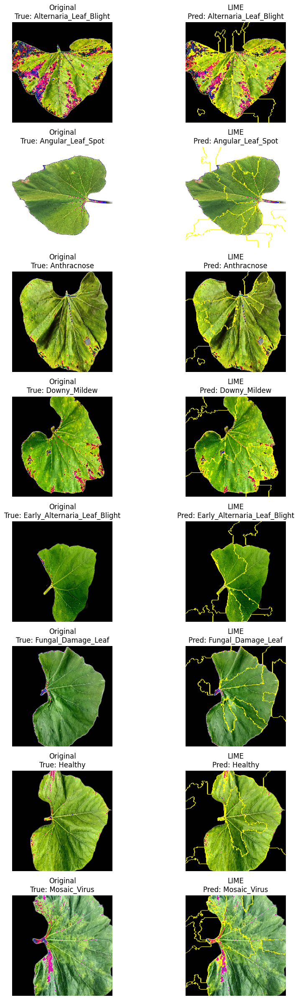

In [32]:
import numpy as np
import matplotlib.pyplot as plt
from lime import lime_image
from skimage.segmentation import mark_boundaries
import tensorflow as tf

# Step 1: Wrap your test dataset to provide 3 identical inputs per sample
def prepare_test_for_ensemble(ds):
    return ds.map(lambda x, y: ((x, x, x), y))

test_ds_ensemble = prepare_test_for_ensemble(test_ds)

# Step 2: Define a prediction function for LIME
def ensemble_predict(images):
    inputs = [images, images, images]  # replicate input for ensemble
    preds = ensemble_model.predict(inputs)
    return preds

# Step 3: Collect one image per class
class_images = {}
for (batch_x1, batch_x2, batch_x3), batch_y in test_ds_ensemble.unbatch():
    label = np.argmax(batch_y.numpy())
    if label not in class_images:
        class_images[label] = (batch_x1.numpy(), batch_y.numpy())
    if len(class_images) == NUM_CLASSES:
        break

# Step 4: Initialize LIME explainer
explainer = lime_image.LimeImageExplainer()

# Step 5: Run LIME on each class image
fig, axes = plt.subplots(nrows=NUM_CLASSES, ncols=2, figsize=(10, NUM_CLASSES * 3))

for i in range(NUM_CLASSES):
    img, label_onehot = class_images[i]
    true_label = np.argmax(label_onehot)

    # Prepare image
    img_uint8 = (img * 255).astype(np.uint8)

    # LIME explanation
    explanation = explainer.explain_instance(
        img_uint8,
        classifier_fn=ensemble_predict,
        top_labels=NUM_CLASSES,
        hide_color=0,
        num_samples=1000
    )

    predicted_label = np.argmax(ensemble_predict(img[np.newaxis, ...]))

    # Get explanation
    temp, mask = explanation.get_image_and_mask(
        label=predicted_label,
        positive_only=True,
        hide_rest=False,
        num_features=10,
        min_weight=0.0
    )

    # Plot
    axes[i, 0].imshow(img_uint8)
    axes[i, 0].set_title(f"Original\nTrue: {class_names[true_label]}")
    axes[i, 0].axis('off')

    axes[i, 1].imshow(mark_boundaries(temp, mask))
    axes[i, 1].set_title(f"LIME\nPred: {class_names[predicted_label]}")
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()


In [33]:
pip install shap


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 996.4/996.4 kB 27.0 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/3 [shap]2/3 [shap]
Note: you may need to restart the kernel to use updated packages.


2025-08-19 08:25:08.445828: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-08-19 08:25:08.561358: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-08-19 08:25:09.589458: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-08-19 08:25:12.527164: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-08-19 08:25:12.634571: E external/local_xla/xla/stream_

Showing SHAP heatmaps for all 1 classes


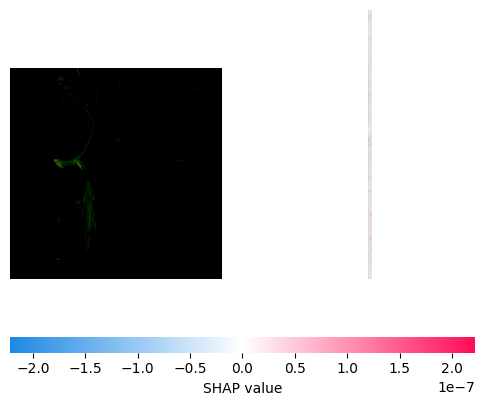

True Label: Mosaic_Virus


In [34]:
import shap
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# ---------------------------
# Step 1: Prepare test dataset for ensemble input
# ---------------------------
def prepare_test_for_ensemble(ds):
    return ds.map(lambda x, y: ((x, x, x), y))

test_ds_ensemble = prepare_test_for_ensemble(test_ds)

# ---------------------------
# Step 2: Extract background images for SHAP
# ---------------------------
background_images = []
for (x1, _, _), _ in test_ds_ensemble.take(10):  # take more batches for better background
    background_images.append(x1.numpy())
background_images = np.concatenate(background_images, axis=0)
background_images = background_images[:100]  # limit to 100 samples

# ---------------------------
# Step 3: Define ensemble prediction function
# ---------------------------
def ensemble_predict_for_shap(images):
    inputs = [images, images, images]
    preds = ensemble_model.predict(inputs)
    return preds

# ---------------------------
# Step 4: Create SHAP explainer
# ---------------------------
explainer = shap.GradientExplainer(ensemble_model, [background_images] * 3)

# ---------------------------
# Step 5: Select a test image for explanation
# ---------------------------
for (batch_x1, batch_x2, batch_x3), batch_y in test_ds_ensemble.take(1):
    test_images = batch_x1[0:1].numpy()  # shape (1, H, W, C)
    true_label = np.argmax(batch_y[0].numpy())
    break

# ---------------------------
# Step 6: Compute SHAP values
# ---------------------------
shap_values_raw = explainer.shap_values([test_images, test_images, test_images])  # 3 inputs → 7 class outputs

# ---------------------------
# Step 7: Aggregate SHAP values from the 3 inputs (ensemble)
# ---------------------------
# shap_values_raw shape: [3][7][1, H, W, C] => convert to [7][1, H, W, C]
shap_values = []
num_classes = len(shap_values_raw[0])
for class_idx in range(num_classes):
    sum_shap = np.sum([
        shap_values_raw[0][class_idx],
        shap_values_raw[1][class_idx],
        shap_values_raw[2][class_idx]
    ], axis=0)
    shap_values.append(sum_shap)

# ---------------------------
# Step 8: Visualize SHAP image explanations for all classes
# ---------------------------
print(f"Showing SHAP heatmaps for all {num_classes} classes")
shap.image_plot(shap_values, test_images)

print(f"True Label: {class_names[true_label]}")


2025-07-29 07:49:09.431426: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-07-29 07:49:09.585074: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-07-29 07:49:10.617050: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-07-29 07:49:10.769645: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-07-29 07:49:11.923984: E external/local_xla/xla/stream_

IndexError: list index out of range

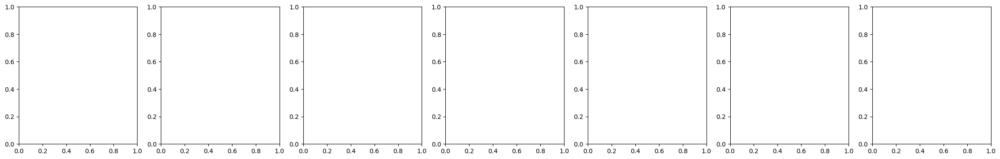

In [30]:
import shap
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# Step 1: Prepare test dataset with 3 identical inputs (if not already done)
def prepare_test_for_ensemble(ds):
    return ds.map(lambda x, y: ((x, x, x), y))

test_ds_ensemble = prepare_test_for_ensemble(test_ds)

# Step 2: Extract representative background images from x1 input
background_images = []
for (x1, _, _), _ in test_ds_ensemble.unbatch().take(100):
    background_images.append(x1.numpy())
background_images = np.array(background_images)

# Step 3: Define prediction wrapper for SHAP
def ensemble_predict_for_shap(images):
    # Replicate input across all 3 ensemble branches
    input_batch = [images, images, images]
    return ensemble_model.predict(input_batch)

# Step 4: Initialize SHAP explainer
explainer = shap.GradientExplainer(ensemble_model, [background_images]*3)

# Step 5: Show SHAP explanations for 7 classes using one test image
for (x1_batch, _, _), y_batch in test_ds_ensemble.take(1):
    test_image = x1_batch[0:1].numpy()   # Shape: (1, 224, 224, 3)
    true_label = np.argmax(y_batch[0].numpy())
    break

# Step 6: Compute SHAP values for the test image
shap_values = explainer.shap_values([test_image]*3)

# Step 7: Visualize SHAP for all classes
num_classes = len(shap_values)
fig, axes = plt.subplots(1, num_classes, figsize=(4 * num_classes, 4))

for i in range(num_classes):
    # shap_values[i][0] shape: (224, 224, 3)
    heatmap = shap_values[i][0]
    img_to_plot = test_image[0]  # Shape: (224, 224, 3)

    axes[i].imshow((img_to_plot * 0.5 + 0.5))  # Normalize to [0,1] range
    axes[i].imshow(heatmap, cmap='jet', alpha=0.5)
    axes[i].set_title(f"Class: {class_names[i]}")
    axes[i].axis('off')

plt.tight_layout()
plt.show()

print(f"True Label: {class_names[true_label]}")


In [29]:
import numpy as np
from sklearn.model_selection import KFold

# Step 1: Extract all images and labels from tf.data.Dataset (e.g., train_ds_full)
images = []
labels = []

for img_batch, label_batch in train_ds_full:  # <-- use your dataset name here
    images.extend(img_batch.numpy())
    labels.extend(label_batch.numpy())

X = np.array(images)
y = np.array(labels)

# Step 2: Optional — convert one-hot labels to categorical if needed
if y.ndim == 2:  # one-hot encoded
    y = np.argmax(y, axis=1)

# Now X and y are ready for K-Fold
print(f"Shape of X: {X.shape}")
print(f"Shape of y: {y.shape}")


NameError: name 'train_ds_full' is not defined

In [ ]:
from sklearn.preprocessing import label_binarize

# Binarize y_true and y_pred for ROC
y_true_bin = label_binarize(y_true, classes=np.arange(len(class_names)))
y_pred_bin = y_pred_probs  # Already probabilities

# Compute macro ROC AUC
roc_auc = roc_auc_score(y_true_bin, y_pred_bin, average="macro")
print(f"Macro-average ROC AUC: {roc_auc:.3f}")


In [ ]:
plt.figure(figsize=(8,4))
plt.plot(val_acc_per_fold, label='Validation Accuracy')
plt.plot(val_loss_per_fold, label='Validation Loss')
plt.title('Validation Accuracy and Loss across Folds')
plt.xlabel('Fold')
plt.ylabel('Score')
plt.legend()
plt.grid(True)
plt.show()
